In [1]:
import numpy as np
import matplotlib.pyplot as plt

from uot import UOT, EntRegUOT
from uot import exact_uot, exact_entreg_uot
from uot import calc_B, calc_f, calc_g
from sinkhorn import calc_R, calc_U, sinkhorn_entreg_uot, sinkhorn
from utils import norm_inf

## Experiments

### Varying epsilon (Synthetic Data)

#### Preparation

In [2]:
# Dimension
n = 10

# Regularization
tau = np.float64(5.0)

# Mass normalization
alpha = 2.0
beta = 4.0

# Number of eps
neps = 20

In [3]:
np.random.seed(3698)

# Cost matrix
C = np.random.uniform(low=1.0, high=50.0, size=(n, n)).astype(np.float64)
C = (C + C.T) / 2.0

# Marginal vectors
a = np.random.uniform(0.1, 1.0, size=n).astype(np.float64)
b = np.random.uniform(0.1, 1.0, size=n).astype(np.float64)

a = a / a.sum() * alpha
b = b / b.sum() * beta

#### Execution

In [4]:
# Original UOT problem
uot = UOT(C, a, b, tau)

# Optimal solution
f_optimal, X_optimal = exact_uot(uot)

print('Optimal:', f_optimal)

Optimal: 20.90467363064458


In [5]:
# Epsilons
eps_arr = np.linspace(start=1.0, stop=0.05, num=neps).astype(np.float64)

kfs, kcs = np.zeros((2, neps))

for i, eps in enumerate(eps_arr):
    # Entropic regularization parameter
    U = calc_U(uot, eps)
    eta = eps / U

    # Convert to Entropic Regularized UOT
    euot = EntRegUOT(C, a, b, tau, eta)

    # Sinkhorn
    _, log = sinkhorn_entreg_uot(euot, eps)

    # Find kf
    kf = log['k_stop']

    # Find kc
    f_approx = np.array([
        calc_f(uot, calc_B(euot, u, v))
        for u, v in zip(log['u'], log['v'])
    ])
    kc = np.where(f_approx - f_optimal > eps)[0][-1]

    kfs[i] = kf
    kcs[i] = kc + 1

float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 

/home/vltanh/Documents/ComputationalOptimalTransport/UnbalancedOT/sinkhorn.py:32: RuntimeWarning: divide by zero encountered in true_divide
  u = (u / p.eta + np.log(p.a / ak)) * scale
/home/vltanh/Documents/ComputationalOptimalTransport/UnbalancedOT/sinkhorn.py:32: RuntimeWarning: overflow encountered in true_divide
  u = (u / p.eta + np.log(p.a / ak)) * scale
/home/vltanh/Documents/ComputationalOptimalTransport/UnbalancedOT/sinkhorn.py:35: RuntimeWarning: divide by zero encountered in log
  v = (v / p.eta + np.log(p.b / bk)) * scale
/home/vltanh/Documents/ComputationalOptimalTransport/UnbalancedOT/uot.py:53: RuntimeWarning: invalid value encountered in add
  return np.exp((u[:, np.newaxis] + v[np.newaxis, :] - p.C) / p.eta)
/home/vltanh/Documents/ComputationalOptimalTransport/UnbalancedOT/utils.py:15: RuntimeWarning: invalid value encountered in subtract
  return np.sum(xlogy(x, x / y) - x + y)


 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64
float64 float64

(1.05, -0.05)

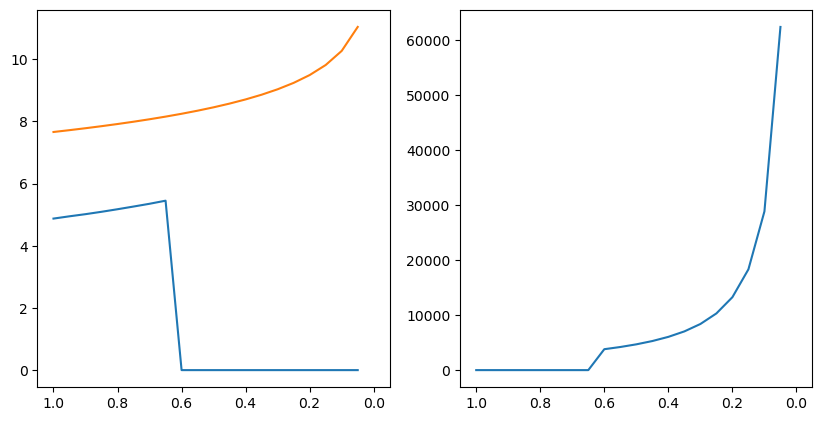

In [6]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), dpi=100)

ax[0].plot(eps_arr, np.log(kcs), label='\log k_f')
ax[0].plot(eps_arr, np.log(kfs), label='\log k_c')
ax[0].set_xlim(1.0 + 0.05, 0 - 0.05)

ax[1].plot(eps_arr, kfs / kcs, label='\log k_f')
ax[1].set_xlim(1.0 + 0.05, 0 - 0.05)

### Theory check (Synthetic data)

#### Preparation

In [7]:
# Dimension
n = 100

# Regularization
tau = np.float64(1.0)
eta = np.float64(0.05)

# Number of Sinkhorn iterations
niters = 500

In [8]:
np.random.seed(3698)

# Cost matrix
C = np.random.uniform(low=1.0, high=100.0, size=(n, n)).astype(np.float64)
C = (C + C.T) / 2.0

# Marginal vectors
a = np.random.uniform(0.1, 10.0, size=n).astype(np.float64)
b = np.random.uniform(0.1, 10.0, size=n).astype(np.float64)

UOT problem

In [9]:
uot = UOT(C, a, b, tau)

Solve UOT with CVXPY

In [10]:
_, X_hat = exact_uot(uot)

Entropic regularized UOT problem

In [11]:
euot = EntRegUOT(C, a, b, tau, eta)

Solve Entropic UOT with CVXPY

In [12]:
_, u_star, v_star = exact_entreg_uot(euot)

In [13]:
X_star = calc_B(euot, u_star, v_star)
a_star = X_star.sum(-1)
b_star = X_star.sum(0)

Solve Entropic UOT with Sinkhorn iterations

In [14]:
X_star_approx, log = sinkhorn(euot, niters)

#### Lemma 1

$$
\frac{u^*}{\tau} = \log(a) - \log(a^*) \\
\frac{v^*}{\tau} = \log(b) - \log(b^*)
$$

0.0014643020164619713


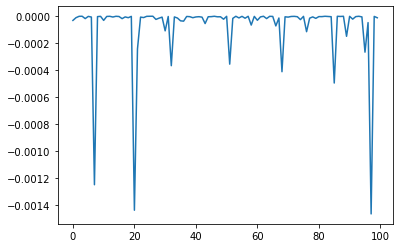

In [15]:
print(norm_inf(u_star / tau - np.log(a / a_star)))

plt.plot(u_star / tau - np.log(a / a_star))
plt.show()

0.002263160043399992


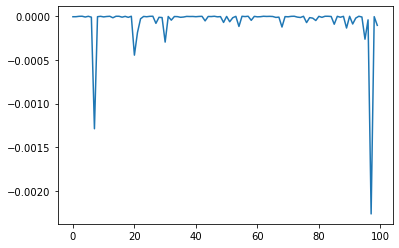

In [16]:
print(norm_inf(v_star / tau - np.log(b / b_star)))

plt.plot(v_star / tau - np.log(b / b_star))
plt.show()

#### Lemma 2

$$
\Big| \log\left( \frac{a_i^*}{a_i^k} \right) -  \frac{u_i^* - u_i^k}{\eta}\Big| \leq  \max_{1 \leq j \leq n} \frac{|v^*_j - v^{k}_j|}{\eta}
$$

$$
\Big| \log\left( \frac{b_j^*}{b_j^k} \right) -  \frac{v_j^* - v_j^k}{\eta}\Big| \leq  \max_{1 \leq i \leq n} \frac{|u^*_i - u^{k}_i|}{\eta}
$$

1.0061396160665481e-16


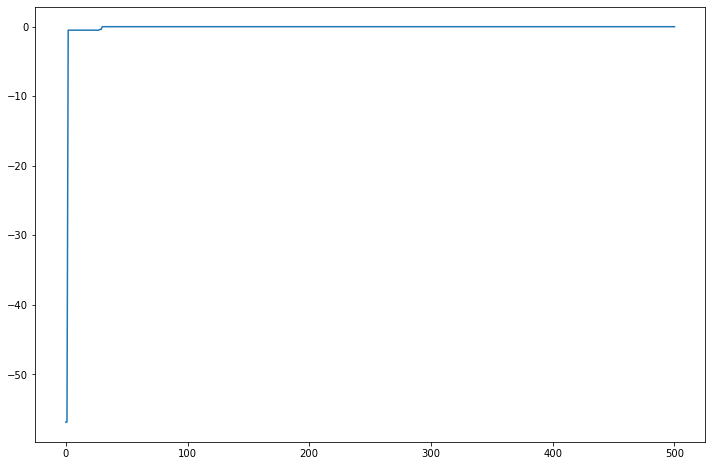

In [17]:
lhs, rhs = np.zeros((2, niters+1))

for k, (uk, vk) in enumerate(zip(log['u'], log['v'])):
    X = calc_B(euot, uk, vk)
    ak = X.sum(-1)

    l = norm_inf(np.log(a_star / ak) - (u_star - uk) / eta)
    r = norm_inf((v_star - vk) / eta)

    lhs[k], rhs[k] = l, r

print(np.max(lhs - rhs))

plt.figure(figsize=(12, 8))
plt.plot(range(niters+1), lhs - rhs)
plt.show()

1.760310647247465e-14


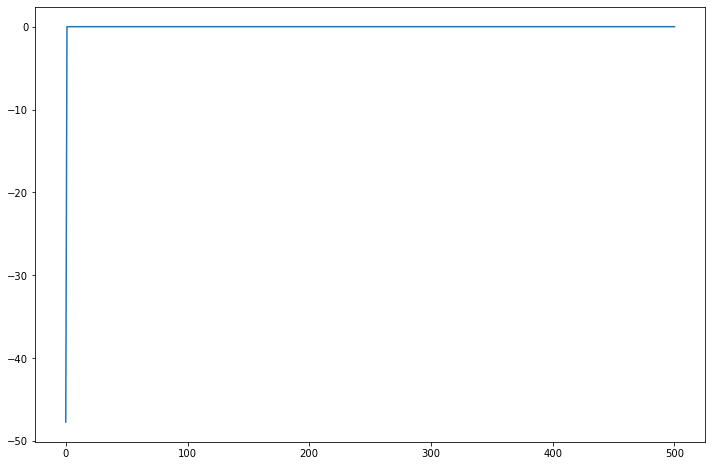

In [18]:
lhs, rhs = np.zeros((2, niters+1))

for k, (uk, vk) in enumerate(zip(log['u'], log['v'])):
    X = calc_B(euot, uk, vk)
    bk = X.sum(0)

    l = norm_inf(np.log(b_star / bk) - (v_star - vk) / eta)
    r = norm_inf((u_star - uk) / eta)

    lhs[k], rhs[k] = l, r

print(np.max(lhs - rhs))

plt.figure(figsize=(12, 8))
plt.plot(range(niters+1), lhs - rhs)
plt.show()

#### Lemma 3

$$
\max \{ \|u^*\|_{\infty},\|v^*\|_\infty \} \le \tau R
$$

In [19]:
R = calc_R(euot)

In [20]:
lhs = max(norm_inf(u_star), norm_inf(v_star))
rhs = tau * R
print(lhs - rhs)

-1964.6588971439326


#### Lemma 4

$$
g(X^*) + (2 \tau + \eta) x^* = \tau (\alpha + \beta) \\
f(\hat{X}) + 2 \tau \hat{x} = \tau (\alpha + \beta)
$$

In [21]:
alpha, beta = a.sum(), b.sum()

In [22]:
lhs1 = calc_g(euot, X_star) + (2 * tau + eta) * np.sum(X_star)
lhs2 = calc_f(uot, X_hat) + 2 * tau * np.sum(X_hat)
rhs = tau * (alpha + beta)
print(lhs1 - rhs)
print(lhs2 - rhs)

float64 float64
float64 float64
float64 float64
float64 float64
-0.00015325659182963136
7.65634149502148e-06


#### Theorem 1

$$
\max \{ \| u^{k} -  u^*\|_\infty, \| v^{k} -  v^*\|_\infty \} \le \Big( \frac{\tau}{\tau + \eta} \Big)^{k-1} \times \tau \times R, \;\; k \geq 1
$$

In [23]:
R = calc_R(euot)

In [24]:
lhs = np.maximum(
    np.max(np.abs(log['u'] - u_star), -1),
    np.max(np.abs(log['v'] - v_star), -1)
)
rhs = (tau / (tau + eta)) ** np.arange(niters + 1) * eta * R

lhs = lhs[1:]
rhs = rhs[:-1]

0.00010438628221249521
0.566


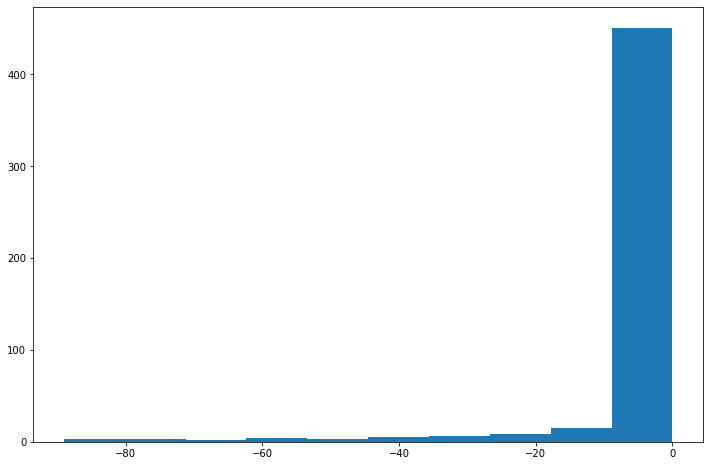

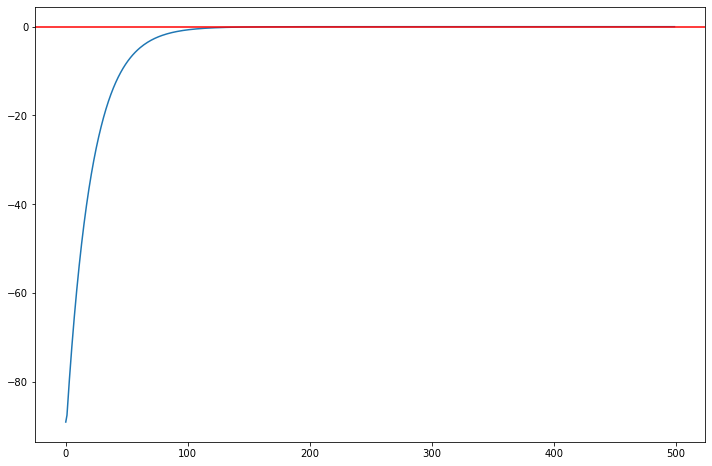

In [25]:
print(np.max(lhs - rhs))

print((lhs - rhs <= 0).sum() / niters)

plt.figure(figsize=(12, 8))
plt.hist(lhs - rhs)
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(range(niters), lhs - rhs)
plt.axhline(0, c='red')
# plt.ylim(-0.00015, 0.00015)
plt.show()